In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import imutils
import math

In [2]:
images_dir = "./train/"
file_list = os.listdir(images_dir)

In [3]:
def image_show(image, nrows=1, ncols=1, cmap='gray'):
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5, 10))
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    return fig, ax

In [4]:
def choose_thresh(img):
    H = []
    for k in range(256):
        H.append(np.sum(img == k))

    def D1(p):
        S = np.dot(np.arange(p + 1), H[:p + 1])
        R = np.sum(H[:p + 1])
        if R == 0:
            return -1
        return S / R
 
    def D2(p):
        S = np.dot(np.arange(p + 1, 256), H[p + 1:])
        R = np.sum(H[p + 1:])
        if R == 0:
            return -1
        return S / R
 
    for p in range(255, 0, -1):
        thresh = D1(p) + D2(p) - 2 * p
        if thresh > 0:
            return p

In [5]:
def filter_and_threshold(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    thresh = choose_thresh(gray)
    edged = cv2.threshold(gray, thresh, 255, cv2.THRESH_BINARY)[1]
    edged = cv2.dilate(edged, None, iterations=2)
    edged = cv2.erode(edged, None, iterations=3)
    return edged

In [6]:
def find_contour(img, start_img):
    cnts = cv2.findContours(img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[1] if imutils.is_cv3() else cnts[0]
    c = max(cnts, key=cv2.contourArea)
    epsilon = 0.01*cv2.arcLength(c,True)
    approx = cv2.approxPolyDP(c,epsilon,True)
    return approx

In [7]:
def find_convex_hull(cnt, image):
    hull = cv2.convexHull(cnt, returnPoints = False)
    defects = cv2.convexityDefects(cnt, hull)

    for i in range(defects.shape[0]):
        s, e, f, d = defects[i, 0]
        start = tuple(cnt[s][0])
        end = tuple(cnt[e][0])
        far = tuple(cnt[f][0])
        a = math.sqrt((end[0] - start[0])**2 + (end[1] - start[1])**2)
        b = math.sqrt((far[0] - start[0])**2 + (far[1] - start[1])**2)
        c = math.sqrt((end[0] - far[0])**2 + (end[1] - far[1])**2)
        dist = (a + b + c) / 2
        angle = math.acos((b**2 + c**2 - a**2) / (2*b*c)) * 57
        if angle <= 90 and dist > 30:
            cv2.line(image, start, far, [0, 255, 0], 2)
            cv2.line(image, far, end, [0, 255, 0], 2)
            cv2.circle(image, start, 5, [0, 0, 255], -1)
            cv2.circle(image, far, 5, [0, 0, 255], -1)
            cv2.circle(image, end, 5, [0, 0, 255], -1)
    return image

In [8]:
def process_image(img_name):
    image = plt.imread(images_dir + img_name)
    gray = filter_and_threshold(image)
    approx = find_contour(gray, image)
    img = find_convex_hull(approx, image)
    image_show(img)

<ipython-input-154-5179acfb71e0>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5, 10))


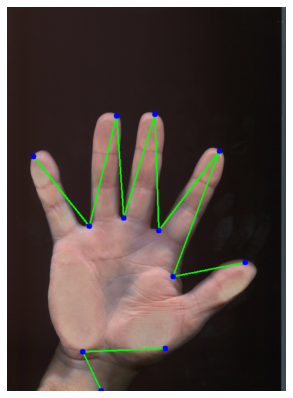

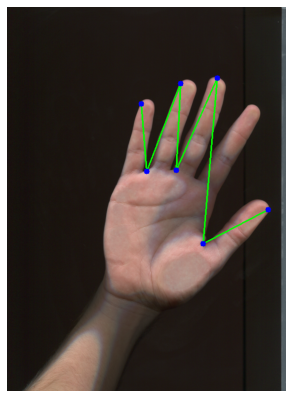

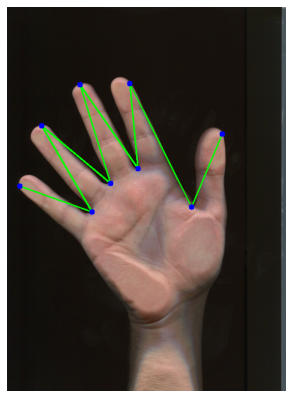

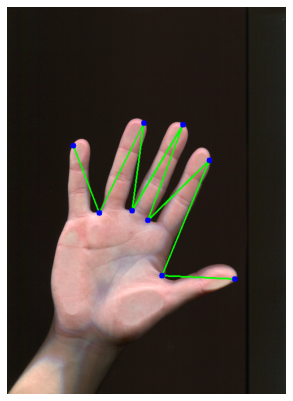

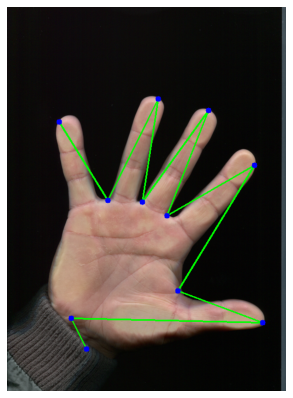

...

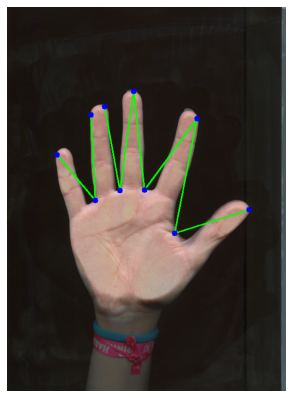

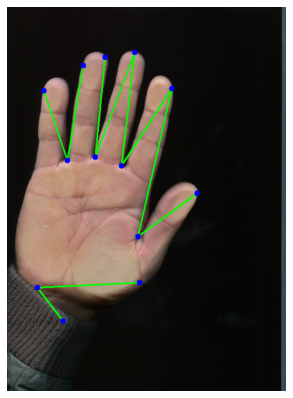

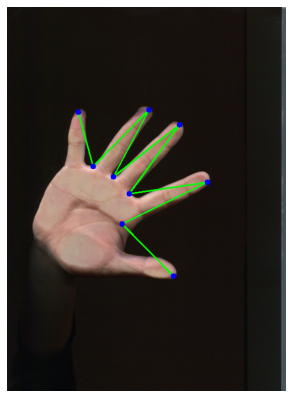

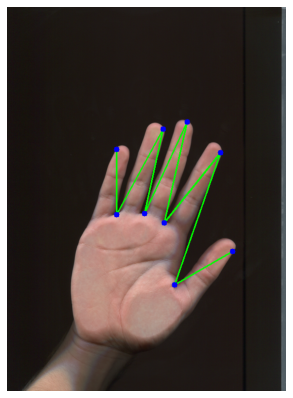

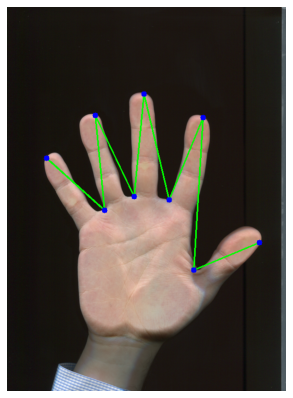

In [185]:
for i in file_list:
    process_image(i)